This is my Jupyter notebook for my geospatial(satellite) image analysis. Student number: **2391434**.

### Importing Neccessary Libraries 

In [54]:
!pip install rasterio

   ---------------------------------------- 0.0/25.4 MB ? eta -:--:--
   ----------------------------------- ---- 22.5/25.4 MB 118.5 MB/s eta 0:00:01
   ---------------------------------------- 25.4/25.4 MB 94.6 MB/s eta 0:00:00


In [56]:
import pandas as pd
import numpy as np
import rasterio
import skimage.exposure
import skimage.io
import os
import matplotlib.pyplot as plt


I was geting errors about my files not found in my folder directory so I needed to be sure of my current working directory. Hence, what I did below:

In [58]:
os.getcwd()

'C:\\Users\\fq24314\\OneDrive - University of Bristol\\Intro to Scientific Computing Assessment\\NewSW_fire\\NewSW_fire-Copy1\\NewSW_fire\\PreFire_20191222'

In [60]:
# User Inputs
# This is to make code adaptable for the New South Wales Bushfire data

# Year inputs for Landsat-8 images
NewSW_Prefire = "2019"
NewSW_Postfire = "2020"

# File paths for NewSW_Prefire and NewSW_Postfire bands: 
NewSW_Prefire = "Downloads/NewSW_fire/NewSW_fire/PreFire_20191222"
NewSW_Postfire = "Downloads/NewSW_fire/NewSW_fire/PostFire_20200123"

# Stack dimensions: [bands, height, width]
stack_dim = (8, 7871, 7831)  # Example dimensions for Landsat-8 stacked images

# Individual band file names for year A and year B
NewSW_2019_blue = "../PreFire_20191222/20191222_B2.tif"
NewSW_2020_blue= "../PostFire_20200123/20200123_B2.tif"

# Output directory path
output_path = "..//NewSW_fire//PreFire_20191222"  # Modify this path as per your working directory

# Required numbers for transforming Landsat-8 data
mult_parameter =  2.75e-05
add_parameter = -0.2

# Band numbers for Landsat-8 (adaptable for other satellites)
  
blue_band = 2  # Blue band position 
green_band = 3 # Green band position 
red_band = 4 # Red band position
nir_band = 5  # NIR band position in stack


# Confirmation message
print("User inputs specified :)")


User inputs specified :)


After gettting my file directory, next is opening my New South Wales Bushfires bands:

### Opening Pre and Post New South Wales Bushfires Bands.

In [62]:
#Pre Fire 
NewSW_2019_blue = rasterio.open("../PreFire_20191222/20191222_B2.tif")
NewSW_2019_green = rasterio.open("../PreFire_20191222/20191222_B3.tif")
NewSW_2019_red = rasterio.open("../PreFire_20191222/20191222_B4.tif")
NewSW_2019_nir = rasterio.open("../PreFire_20191222/20191222_B5.tif")
NewSW_2019_swir = rasterio.open("../PreFire_20191222/20191222_B6.tif")

#Post Fire
NewSW_2020_blue = rasterio.open("../PostFire_20200123/20200123_B2.tif")
NewSW_2020_green = rasterio.open("../PostFire_20200123/20200123_B3.tif")
NewSW_2020_red = rasterio.open("../PostFire_20200123/20200123_B4.tif")
NewSW_2020_nir = rasterio.open("../PostFire_20200123/20200123_B5.tif")
NewSW_2020_swir = rasterio.open("../PostFire_20200123/20200123_B6.tif")

In [63]:
#Pre Fire 
NewSW_2019_blueband = NewSW_2019_blue.read(1)
NewSW_2019_greenband = NewSW_2019_green.read(1)
NewSW_2019_redband = NewSW_2019_red.read(1)
NewSW_2019_nirband = NewSW_2019_nir.read(1)
NewSW_2019_swirband = NewSW_2019_swir.read(1)

#Post Fire
NewSW_2020_blueband = NewSW_2020_blue.read(1)
NewSW_2020_greenband = NewSW_2020_green.read(1)
NewSW_2020_redband = NewSW_2020_red.read(1)
NewSW_2020_nirband = NewSW_2020_nir.read(1)
NewSW_2020_swirband = NewSW_2020_swir.read(1)

Although, the original landsat 8 data include all the 8 bands, but I am only interested in 5 of them, hence:

In [65]:
NewSW2019_bands = {
    "blue": NewSW_2019_blueband,
    "green": NewSW_2019_greenband,
    "red": NewSW_2019_redband,
    "nir": NewSW_2019_nirband,
    "swir": NewSW_2019_swirband}

NewSW2020_bands = {
    "postfire blue": NewSW_2020_blueband,
    "postfire green": NewSW_2020_greenband,
    "postfire red": NewSW_2020_redband,
    "postfire nir": NewSW_2020_nirband,
    "postfire swir": NewSW_2020_swirband}

In [66]:
print("Keys in NewSW2019_bands:", NewSW2019_bands.keys(), "\n"
      "Keys in NewSW2020_bands:", NewSW2020_bands.keys())

Keys in NewSW2019_bands: dict_keys(['blue', 'green', 'red', 'nir', 'swir']) 
Keys in NewSW2020_bands: dict_keys(['postfire blue', 'postfire green', 'postfire red', 'postfire nir', 'postfire swir'])


In [67]:
NewSW2019_bands_arr_st = np.stack(
    [NewSW_2019_blueband, NewSW_2019_greenband, NewSW_2019_redband, NewSW_2019_nirband, NewSW_2019_swirband],
    axis=0 
)
NewSW2020_bands_arr_st = np.stack(
    [NewSW_2020_blueband, NewSW_2020_greenband, NewSW_2020_redband, NewSW_2020_nirband, NewSW_2020_swirband],
    axis=0 
)

In [68]:
print(f'Prefire Height: {NewSW2019_bands_arr_st.shape[1]}\nPrefire Width: {NewSW2019_bands_arr_st.shape[2]}\nPrefire Bands: {NewSW2019_bands_arr_st.shape[0]}')

Prefire Height: 7871
Prefire Width: 7831
Prefire Bands: 5


In [69]:
print(f'Postfire Height: {NewSW2020_bands_arr_st.shape[1]}\nPostfire Width: {NewSW2020_bands_arr_st.shape[2]}\nPostfire Bands: {NewSW2020_bands_arr_st.shape[0]}')

Postfire Height: 7871
Postfire Width: 7821
Postfire Bands: 5


### Calculating Statistics for Each Bands.

#### New South Wales 2019 Blueband

In [72]:
NewSW_2019_blueband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [73]:
Blueband_image = NewSW_2019_blue.read(1)
Blueband_stats = []
for band in Blueband_image:
    Blueband_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Blueband_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 6.865789809730558,
  'median': 0.0,
  'std dev': 271.8775583049886,
  'max': 11672},
 {'min': 0,
  'mean': 12.8408887753799,
  'median': 0.0,
  'std dev': 379.3048470507884,
  'max': 12031},
 {'min': 0,
  'mean': 17.413101774996807,
  'median': 0.0,
  'std dev': 427.03407051921647,
  'max': 10683},
 {'min': 0,
  'mean': 25.918145830672966,
  'median': 0.0,
  'std dev': 525.8644670326994,
  'max': 12242},
 {'min': 0,
  'mean': 32.29434299578598,
  'median': 0.0,
  'std dev': 595.7513719414698,
  'max': 12511}]

#### New South Wales 2020 Blueband

In [75]:
NewSW_2020_blueband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [76]:
Blueband2020_image = NewSW_2020_blue.read(1)
Blueband2020_stats = []
for band in Blueband2020_image:
    Blueband2020_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Blueband2020_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell.

[{'min': 0,
  'mean': 9.297020841324638,
  'median': 0.0,
  'std dev': 310.6375947248432,
  'max': 10554},
 {'min': 0,
  'mean': 14.771896176959467,
  'median': 0.0,
  'std dev': 393.6581293528984,
  'max': 10738},
 {'min': 0,
  'mean': 19.569364531389848,
  'median': 0.0,
  'std dev': 447.0051142088319,
  'max': 10774},
 {'min': 0,
  'mean': 25.710906533691343,
  'median': 0.0,
  'std dev': 508.4485249148935,
  'max': 10876},
 {'min': 0,
  'mean': 32.12977880066488,
  'median': 0.0,
  'std dev': 568.41067681408,
  'max': 12029}]

#### New South Wales 2019 Greenband

In [78]:
NewSW_2019_greenband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [79]:
Greenband_image = NewSW_2019_green.read(1)
Greenband_stats = []
for band in Greenband_image:
   Greenband_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Greenband_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 8.04852509258077,
  'median': 0.0,
  'std dev': 318.4429859941662,
  'max': 12902},
 {'min': 0,
  'mean': 14.610394585621249,
  'median': 0.0,
  'std dev': 430.8112689110494,
  'max': 13045},
 {'min': 0,
  'mean': 20.622270463542332,
  'median': 0.0,
  'std dev': 505.72936145297297,
  'max': 12499},
 {'min': 0,
  'mean': 30.853786234197422,
  'median': 0.0,
  'std dev': 625.6743893794744,
  'max': 13333},
 {'min': 0,
  'mean': 38.308772825948154,
  'median': 0.0,
  'std dev': 705.9737176227713,
  'max': 13697}]

#### New South Wales 2020 Greenband

In [81]:
NewSW_2020_greenband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [82]:
Greenband2020_image = NewSW_2020_green.read(1)
Greenband2020_stats = []
for band in Greenband2020_image:
   Greenband2020_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Greenband2020_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 10.712313003452245,
  'median': 0.0,
  'std dev': 357.97408521461364,
  'max': 12251},
 {'min': 0,
  'mean': 17.06226825214167,
  'median': 0.0,
  'std dev': 454.74370101352355,
  'max': 12417},
 {'min': 0,
  'mean': 22.47743255338192,
  'median': 0.0,
  'std dev': 513.8269327031325,
  'max': 12433},
 {'min': 0,
  'mean': 29.301623833269403,
  'median': 0.0,
  'std dev': 579.9047516319124,
  'max': 12583},
 {'min': 0,
  'mean': 36.39342795038998,
  'median': 0.0,
  'std dev': 644.3126415067418,
  'max': 13005}]

#### New South Wales 2019 Redband

In [84]:
NewSW_2019_redband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [85]:
Redband_image = NewSW_2019_red.read(1)
Redband_stats = []
for band in Redband_image:
   Redband_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Redband_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 9.038564678840507,
  'median': 0.0,
  'std dev': 357.60344735351714,
  'max': 14407},
 {'min': 0,
  'mean': 16.34235729791853,
  'median': 0.0,
  'std dev': 481.83511115100214,
  'max': 14512},
 {'min': 0,
  'mean': 23.093985442472224,
  'median': 0.0,
  'std dev': 566.3539653345324,
  'max': 14061},
 {'min': 0,
  'mean': 34.576299323202655,
  'median': 0.0,
  'std dev': 701.1459784346666,
  'max': 14589},
 {'min': 0,
  'mean': 42.800408632358575,
  'median': 0.0,
  'std dev': 788.8261589918155,
  'max': 15449}]

#### New South Wales 2020 Redband

In [87]:
NewSW_2020_redband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [88]:
Redband2020_image = NewSW_2020_red.read(1)
Redband2020_stats = []
for band in Redband2020_image:
   Redband2020_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Redband2020_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 12.946937731747859,
  'median': 0.0,
  'std dev': 432.9334744477778,
  'max': 15095},
 {'min': 0,
  'mean': 20.61488300728807,
  'median': 0.0,
  'std dev': 549.6019756830146,
  'max': 15160},
 {'min': 0,
  'mean': 26.622554660529342,
  'median': 0.0,
  'std dev': 609.8311522370449,
  'max': 15181},
 {'min': 0,
  'mean': 34.14588927247155,
  'median': 0.0,
  'std dev': 677.0439318720306,
  'max': 15026},
 {'min': 0,
  'mean': 42.06265183480373,
  'median': 0.0,
  'std dev': 746.2062943257854,
  'max': 15209}]

#### New South Wales 2019 NIRband

In [90]:
NewSW_2019_nirband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [91]:
Nirband_image = NewSW_2019_nir.read(1)
Nirband_stats = []
for band in Nirband_image:
   Nirband_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Nirband_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 10.85787255778317,
  'median': 0.0,
  'std dev': 429.56721200820994,
  'max': 17078},
 {'min': 0,
  'mean': 19.530966670923252,
  'median': 0.0,
  'std dev': 575.7916267859143,
  'max': 17134},
 {'min': 0,
  'mean': 28.217469033329078,
  'median': 0.0,
  'std dev': 692.0006372560233,
  'max': 17225},
 {'min': 0,
  'mean': 42.29370450772571,
  'median': 0.0,
  'std dev': 857.6265916862748,
  'max': 17714},
 {'min': 0,
  'mean': 52.43468267143405,
  'median': 0.0,
  'std dev': 966.2592159837476,
  'max': 18747}]

#### New South Wales 2020 NIRband

In [93]:
NewSW_2020_nirband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [94]:
Nirband2020_image = NewSW_2020_nir.read(1)
Nirband2020_stats = []
for band in Nirband2020_image:
   Nirband2020_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Nirband2020_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 16.204577419767293,
  'median': 0.0,
  'std dev': 542.1935136548071,
  'max': 19165},
 {'min': 0,
  'mean': 26.014192558496354,
  'median': 0.0,
  'std dev': 693.7360102294654,
  'max': 19340},
 {'min': 0,
  'mean': 34.28078250863061,
  'median': 0.0,
  'std dev': 783.4089687061789,
  'max': 18975},
 {'min': 0,
  'mean': 45.13885692366705,
  'median': 0.0,
  'std dev': 892.6663229892389,
  'max': 18971},
 {'min': 0,
  'mean': 55.39739163789797,
  'median': 0.0,
  'std dev': 980.314691763024,
  'max': 19018}]

#### New South Wales 2019 SWIRband

In [96]:
NewSW_2019_swirband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [97]:
Swirband_image = NewSW_2019_swir.read(1)
Swirband_stats = []
for band in Swirband_image:
   Swirband_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Swirband_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 13.79645000638488,
  'median': 0.0,
  'std dev': 545.8239614584754,
  'max': 21655},
 {'min': 0,
  'mean': 24.81560464819308,
  'median': 0.0,
  'std dev': 731.5820881111995,
  'max': 21669},
 {'min': 0,
  'mean': 35.9645000638488,
  'median': 0.0,
  'std dev': 881.9785995411991,
  'max': 21874},
 {'min': 0,
  'mean': 53.178521261652406,
  'median': 0.0,
  'std dev': 1078.4706567780406,
  'max': 22693},
 {'min': 0,
  'mean': 65.91623036649214,
  'median': 0.0,
  'std dev': 1214.9028487148641,
  'max': 23638}]

#### New South Wales 2020 SWIRband

In [99]:
NewSW_2020_swirband

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [100]:
Swirband2020_image = NewSW_2020_swir.read(1)
Swirband2020_stats = []
for band in Swirband2020_image:
   Swirband2020_stats.append({
        'min': band.min(),
        'mean': band.mean(),
        'median': np.median(band),
        'std dev': np.std(band),
        'max': band.max()
        
    })
Swirband2020_stats[17:22] # I had to limit to just the first five rows with actual values due to too many 0s in the arrays as seen in the previous cell. 

[{'min': 0,
  'mean': 20.973404935430253,
  'median': 0.0,
  'std dev': 701.3444373133962,
  'max': 24507},
 {'min': 0,
  'mean': 33.39688019434855,
  'median': 0.0,
  'std dev': 890.4261074723804,
  'max': 24484},
 {'min': 0,
  'mean': 42.509014192558496,
  'median': 0.0,
  'std dev': 975.0127669646618,
  'max': 24287},
 {'min': 0,
  'mean': 54.92775859864467,
  'median': 0.0,
  'std dev': 1090.379318494339,
  'max': 24256},
 {'min': 0,
  'mean': 68.69901547116737,
  'median': 0.0,
  'std dev': 1218.9876366853844,
  'max': 24735}]

After calculating the statistics for each bands, next is to convert the shapes from 2D to 1D so I can flatten and plot visual rasters.

#### Converting Shapes of Each Band from 2D to 1D.

In [102]:
print("Prefire Blueband shape is:", NewSW_2019_blueband.shape, "\n"
      "Prefire Greenband shape is:", NewSW_2019_greenband.shape, "\n"
    "Prefire Redband shape is:", NewSW_2019_redband.shape, "\n"
      "Prefire NIRband shape is:", NewSW_2019_nirband.shape, "\n"
      "Prefire SWIRband shape is:", NewSW_2019_swirband.shape, "\n"
      "\n"

      #For 2020 bands:
      "Postfire Blueband shape is:", NewSW_2020_blueband.shape, "\n"
      "Postfire Greenband shape is:", NewSW_2020_greenband.shape, "\n"
    "Postfire Redband shape is:", NewSW_2020_redband.shape, "\n"
      "Postfire NIRband shape is:", NewSW_2020_nirband.shape, "\n"
      "Postfire SWIRband shape is:", NewSW_2020_swirband.shape, "\n"
)

Prefire Blueband shape is: (7871, 7831) 
Prefire Greenband shape is: (7871, 7831) 
Prefire Redband shape is: (7871, 7831) 
Prefire NIRband shape is: (7871, 7831) 
Prefire SWIRband shape is: (7871, 7831) 

Postfire Blueband shape is: (7871, 7821) 
Postfire Greenband shape is: (7871, 7821) 
Postfire Redband shape is: (7871, 7821) 
Postfire NIRband shape is: (7871, 7821) 
Postfire SWIRband shape is: (7871, 7821) 



In [103]:
Blueflat = np.ndarray.flatten(NewSW_2019_blueband)
Greenflat = np.ndarray.flatten(NewSW_2019_greenband)
Redflat = np.ndarray.flatten(NewSW_2019_redband)
Nirflat = np.ndarray.flatten(NewSW_2019_nirband)
Swirflat = np.ndarray.flatten(NewSW_2019_swirband)
#For 2020 bands:
Blueflat_2020 = np.ndarray.flatten(NewSW_2020_blueband)
Greenflat_2020 = np.ndarray.flatten(NewSW_2020_greenband)
Redflat_2020 = np.ndarray.flatten(NewSW_2020_redband)
Nirflat_2020 = np.ndarray.flatten(NewSW_2020_nirband)
Swirflat_2020 = np.ndarray.flatten(NewSW_2020_swirband)

print("New Prefire Blueband shape is:", Blueflat.shape, "\n"
      "New Prefire Greenband shape is:", Greenflat.shape, "\n"
    "New Prefire Redband shape is:", Redflat.shape, "\n"
      "New Prefire NIRband shape is:", Nirflat.shape, "\n"
      "New Prefire SWIRband shape is:", Swirflat.shape, "\n"
      "\n"
      #For 2020 bands:
      "New Postfire Blueband shape is:", Blueflat_2020.shape, "\n"
      "New Postfire Greenband shape is:", Greenflat_2020.shape, "\n"
    "New Postfire Redband shape is:", Redflat_2020.shape, "\n"
      "New Postfire NIRband shape is:", Nirflat_2020.shape, "\n"
      "New Postfire SWIRband shape is:", Swirflat_2020.shape, "\n"
)

New Prefire Blueband shape is: (61637801,) 
New Prefire Greenband shape is: (61637801,) 
New Prefire Redband shape is: (61637801,) 
New Prefire NIRband shape is: (61637801,) 
New Prefire SWIRband shape is: (61637801,) 

New Postfire Blueband shape is: (61559091,) 
New Postfire Greenband shape is: (61559091,) 
New Postfire Redband shape is: (61559091,) 
New Postfire NIRband shape is: (61559091,) 
New Postfire SWIRband shape is: (61559091,) 



### Visualizing Raster Layers.

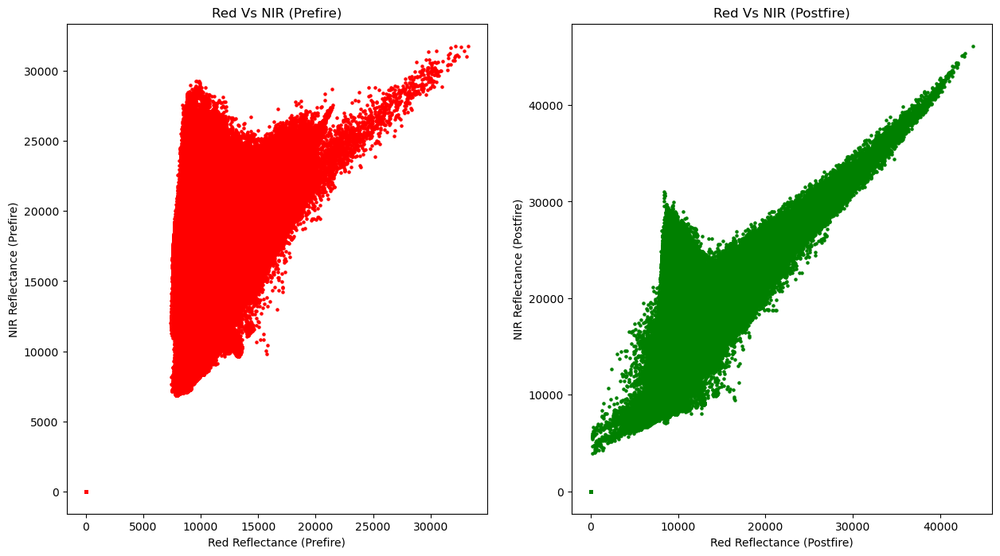

In [105]:

fig, axes = plt.subplots(1, 2, figsize=(15, 8))

# Scatter plot for pre-fire
axes[0].scatter(Redflat, Nirflat, s=5, color='r', marker='o')
axes[0].set_xlabel('Red Reflectance (Prefire)')
axes[0].set_ylabel('NIR Reflectance (Prefire)')
axes[0].set_title('Red Vs NIR (Prefire)')

# Scatter plot for post-fire
axes[1].scatter(Redflat_2020, Nirflat_2020, s=5, color='g', marker='o')
axes[1].set_xlabel('Red Reflectance (Postfire)')
axes[1].set_ylabel('NIR Reflectance (Postfire)')
axes[1].set_title('Red Vs NIR (Postfire)')


# Show the plots
plt.show()


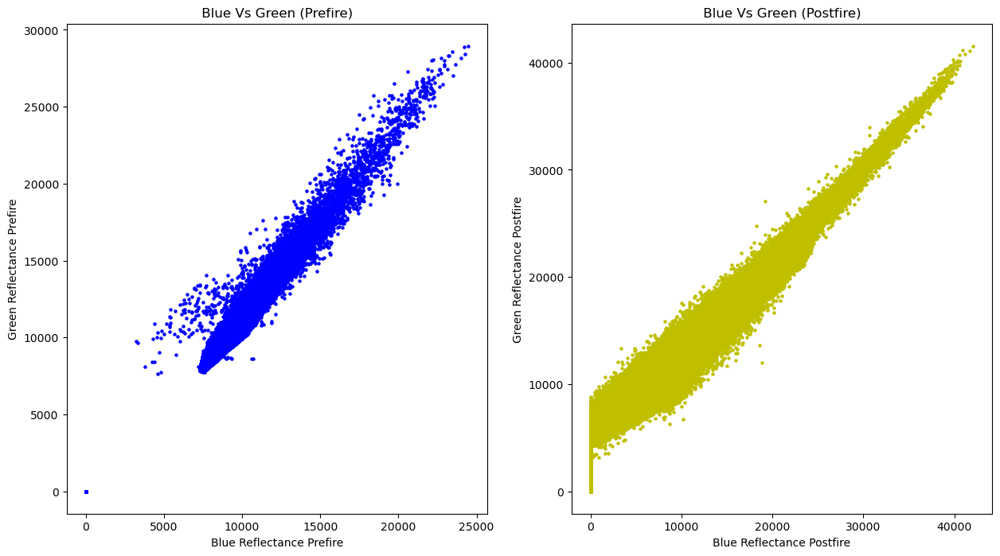

In [106]:
fig, axes = plt.subplots(1,2, figsize = (15, 8) )

axes[0].scatter(Blueflat, Greenflat, s=5, color='b', marker='o')
axes[0].set_xlabel('Blue Reflectance Prefire')
axes[0].set_ylabel('Green Reflectance Prefire')
axes[0].set_title (' Blue Vs Green (Prefire) ' )

axes[1].scatter(Blueflat_2020, Greenflat_2020, s=5, color='y', marker='o')
axes[1].set_xlabel('Blue Reflectance Postfire')
axes[1].set_ylabel('Green Reflectance Postfire')
axes[1].set_title (' Blue Vs Green (Postfire) ' )

plt.show()

Next, a function was created to convert each bands to reflectance values.

#### Conversion of Bands to Reflectance Values

In [109]:
def convert_to_reflectance(band):
    mult_parameter =  2.75e-05
    add_parameter = -0.2
    return band * mult_parameter + add_parameter

In [110]:
NewSW2019_Blue_reflect = convert_to_reflectance(NewSW_2019_blueband)
NewSW2019_Green_reflect = convert_to_reflectance(NewSW_2019_greenband)
NewSW2019_Red_reflect = convert_to_reflectance(NewSW_2019_redband)
NewSW2019_NIR_reflect = convert_to_reflectance(NewSW_2019_nirband)
NewSW2019_SWIR_reflect = convert_to_reflectance(NewSW_2019_swirband)

#For Postfire:

NewSW2020_Blue_reflect = convert_to_reflectance(NewSW_2020_blueband)
NewSW2020_Green_reflect = convert_to_reflectance(NewSW_2020_greenband)
NewSW2020_Red_reflect = convert_to_reflectance(NewSW_2020_redband)
NewSW2020_NIR_reflect = convert_to_reflectance(NewSW_2020_nirband)
NewSW2020_SWIR_reflect = convert_to_reflectance(NewSW_2020_swirband)


#### Plotting Prefire Bands for New South Wales.

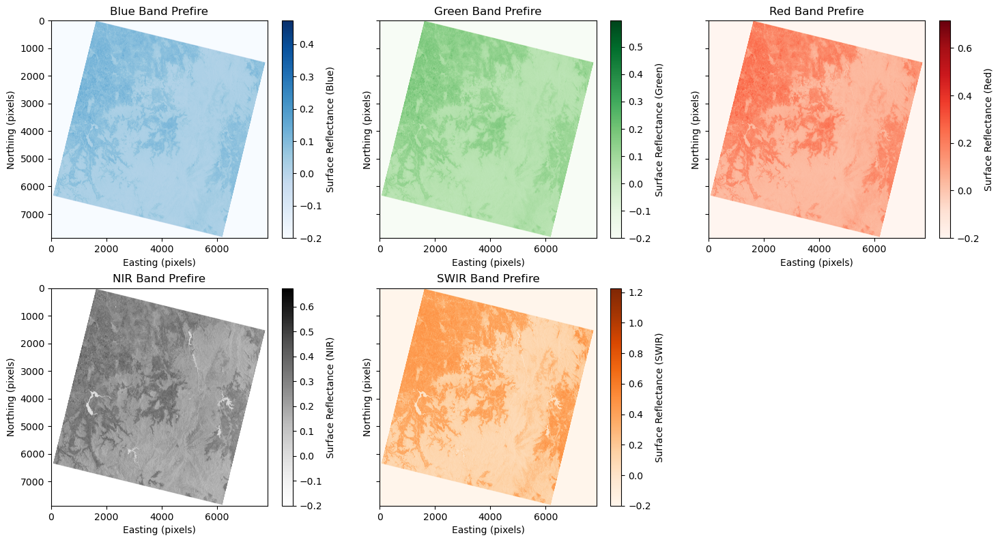

In [112]:
#For Prefire
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8), sharey=True)
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Plot Blue Band
im = axes[0].imshow(NewSW2019_Blue_reflect, cmap='Blues')
axes[0].set_title('Blue Band Prefire')
axes[0].set_ylabel('Northing (pixels)')
axes[0].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[0], label="Surface Reflectance (Blue)")

# Plot Green Band
im = axes[1].imshow(NewSW2019_Green_reflect, cmap='Greens')
axes[1].set_title('Green Band Prefire')
axes[1].set_ylabel('Northing (pixels)')
axes[1].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[1], label="Surface Reflectance (Green)")

# Plot Red Band
im = axes[2].imshow(NewSW2019_Red_reflect, cmap='Reds')
axes[2].set_title('Red Band Prefire')
axes[2].set_ylabel('Northing (pixels)')
axes[2].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[2], label="Surface Reflectance (Red)")

# Plot NIR Band
im = axes[3].imshow(NewSW2019_NIR_reflect, cmap='Greys')
axes[3].set_title('NIR Band Prefire')
axes[3].set_ylabel('Northing (pixels)')
axes[3].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[3], label="Surface Reflectance (NIR)")

# Plot SWIR Band
im = axes[4].imshow(NewSW2019_SWIR_reflect, cmap='Oranges')
axes[4].set_title('SWIR Band Prefire')
axes[4].set_ylabel('Northing (pixels)')
axes[4].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[4], label="Surface Reflectance (SWIR)")

 # Hiding my unused sixth subplot (axes[5])
axes[5].axis('off')

# Show the plot
plt.tight_layout()
plt.show()


#### Plotting Postfire Bands for New South Wales.

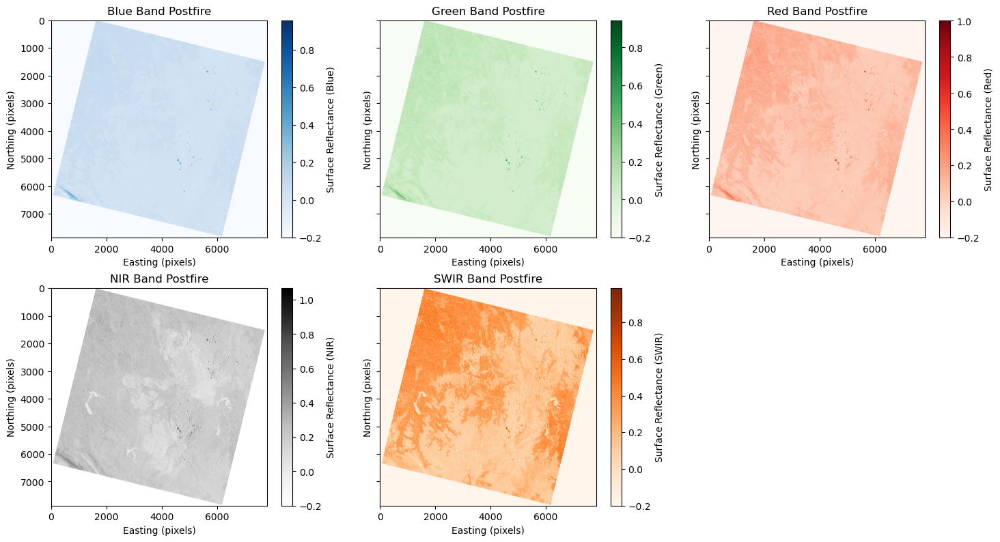

In [114]:

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8), sharey=True)
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Plot Blue Band
im = axes[0].imshow(NewSW2020_Blue_reflect, cmap='Blues')
axes[0].set_title('Blue Band Postfire')
axes[0].set_ylabel('Northing (pixels)')
axes[0].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[0], label="Surface Reflectance (Blue)")

# Plot Green Band
im = axes[1].imshow(NewSW2020_Green_reflect, cmap='Greens')
axes[1].set_title('Green Band Postfire')
axes[1].set_ylabel('Northing (pixels)')
axes[1].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[1], label="Surface Reflectance (Green)")

# Plot Red Band
im = axes[2].imshow(NewSW2020_Red_reflect, cmap='Reds')
axes[2].set_title('Red Band Postfire')
axes[2].set_ylabel('Northing (pixels)')
axes[2].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[2], label="Surface Reflectance (Red)")

# Plot NIR Band
im = axes[3].imshow(NewSW2020_NIR_reflect, cmap='Greys')
axes[3].set_title('NIR Band Postfire')
axes[3].set_ylabel('Northing (pixels)')
axes[3].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[3], label="Surface Reflectance (NIR)")

# Plot SWIR Band
im = axes[4].imshow(NewSW2020_SWIR_reflect, cmap='Oranges')
axes[4].set_title('SWIR Band Postfire')
axes[4].set_ylabel('Northing (pixels)')
axes[4].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[4], label="Surface Reflectance (SWIR)")

# Hiding my unused sixth subplot (axes[5])
axes[5].axis('off')

# Show the plot
plt.tight_layout()
plt.show()


#### Calculating Differences in the Bands.

It was observed that the 2019 reflectance arrays are not of same dimensions with the 2020 arrays, hence a resize is needed before calculating their differences.

In [117]:
from skimage.transform import resize

# Resize 2019 reflectance arrays to match 2020 reflectance array dimensions
NewSW2019_Blue_reflect_resized = resize(NewSW2019_Blue_reflect, NewSW2020_Blue_reflect.shape, mode='reflect', anti_aliasing=True)
NewSW2019_Green_reflect_resized = resize(NewSW2019_Green_reflect, NewSW2020_Green_reflect.shape, mode='reflect', anti_aliasing=True)
NewSW2019_Red_reflect_resized = resize(NewSW2019_Red_reflect, NewSW2020_Red_reflect.shape, mode='reflect', anti_aliasing=True)
NewSW2019_NIR_reflect_resized = resize(NewSW2019_NIR_reflect, NewSW2020_NIR_reflect.shape, mode='reflect', anti_aliasing=True)
NewSW2019_SWIR_reflect_resized = resize(NewSW2019_SWIR_reflect, NewSW2020_SWIR_reflect.shape, mode='reflect', anti_aliasing=True)

# Now perform the subtraction
Blue_reflectance_diff = NewSW2020_Blue_reflect - NewSW2019_Blue_reflect_resized
Green_reflectance_diff = NewSW2020_Green_reflect - NewSW2019_Green_reflect_resized
Red_reflectance_diff = NewSW2020_Red_reflect - NewSW2019_Red_reflect_resized
NIR_reflectance_diff = NewSW2020_NIR_reflect - NewSW2019_NIR_reflect_resized
SWIR_reflectance_diff = NewSW2020_SWIR_reflect - NewSW2019_SWIR_reflect_resized




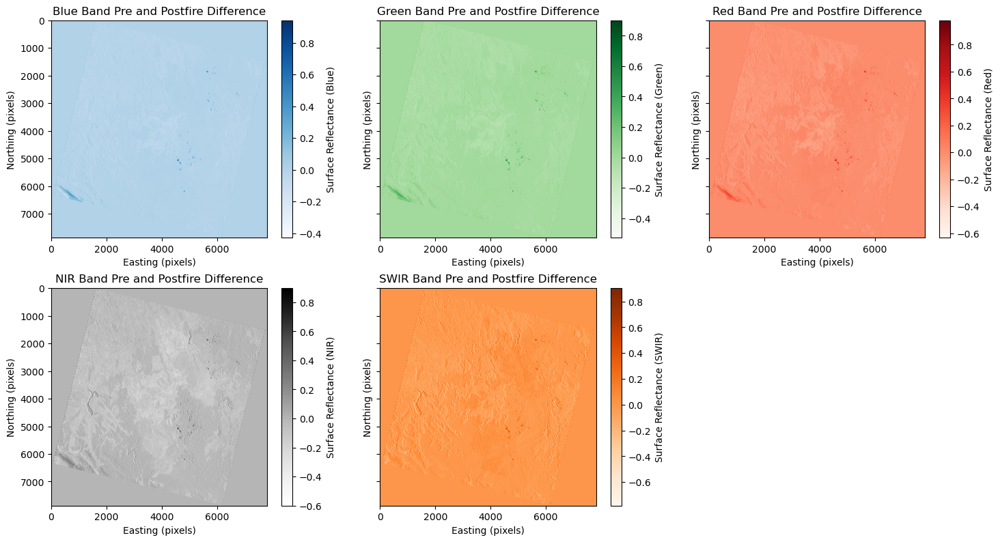

In [118]:

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8), sharey=True)
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Plot Blue Band
im = axes[0].imshow(Blue_reflectance_diff, cmap='Blues')
axes[0].set_title('Blue Band Pre and Postfire Difference')
axes[0].set_ylabel('Northing (pixels)')
axes[0].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[0], label="Surface Reflectance (Blue)")

# Plot Green Band
im = axes[1].imshow(Green_reflectance_diff, cmap='Greens')
axes[1].set_title('Green Band Pre and Postfire Difference')
axes[1].set_ylabel('Northing (pixels)')
axes[1].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[1], label="Surface Reflectance (Green)")

# Plot Red Band
im = axes[2].imshow(Red_reflectance_diff, cmap='Reds')
axes[2].set_title('Red Band Pre and Postfire Difference')
axes[2].set_ylabel('Northing (pixels)')
axes[2].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[2], label="Surface Reflectance (Red)")

# Plot NIR Band
im = axes[3].imshow(NIR_reflectance_diff, cmap='Greys')
axes[3].set_title('NIR Band Pre and Postfire Difference')
axes[3].set_ylabel('Northing (pixels)')
axes[3].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[3], label="Surface Reflectance (NIR)")

# Plot SWIR Band
im = axes[4].imshow(SWIR_reflectance_diff, cmap='Oranges')
axes[4].set_title('SWIR Band Pre and Postfire Difference')
axes[4].set_ylabel('Northing (pixels)')
axes[4].set_xlabel('Easting (pixels)')
cbar = fig.colorbar(im, ax=axes[4], label="Surface Reflectance (SWIR)")

# Hiding my unused sixth subplot (axes[5])
axes[5].axis('off')

# Show the plot
plt.tight_layout()
plt.show()


#### Plotting Histogram for Prefire New South Wales Bands. 

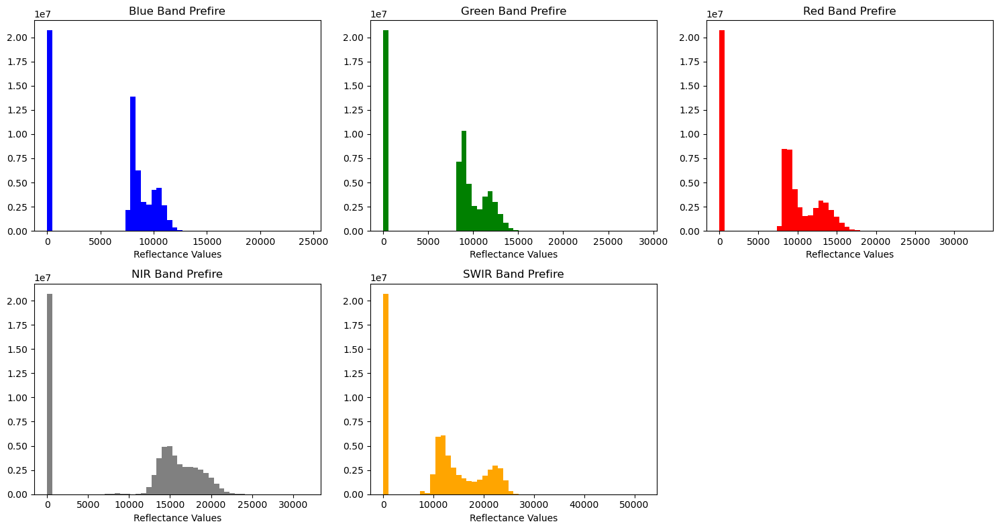

In [120]:

nbins = 50

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8), sharey=False)
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Plot Blue Band
axes[0].hist(NewSW_2019_blueband.ravel(), color='blue', bins=nbins)
axes[0].set_title('Blue Band Prefire')
axes[0].set_xlabel('Reflectance Values')

# Plot Green Band
axes[1].hist(NewSW_2019_greenband.ravel(), color='green', bins=nbins)
axes[1].set_title('Green Band Prefire')
axes[1].set_xlabel('Reflectance Values')

# Plot Red Band
axes[2].hist(NewSW_2019_redband.ravel(), color='red', bins=nbins)
axes[2].set_title('Red Band Prefire')
axes[2].set_xlabel('Reflectance Values')

# Plot NIR Band
axes[3].hist(NewSW_2019_nirband.ravel(), color='grey', bins=nbins)
axes[3].set_title('NIR Band Prefire')
axes[3].set_xlabel('Reflectance Values')

# Plot SWIR Band
axes[4].hist(NewSW_2019_swirband.ravel(), color='orange', bins=nbins)
axes[4].set_title('SWIR Band Prefire')
axes[4].set_xlabel('Reflectance Values')

# Hiding my unused sixth subplot (axes[5])
axes[5].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()


#### Plotting Histogram for Postfire New South Wales Bands.

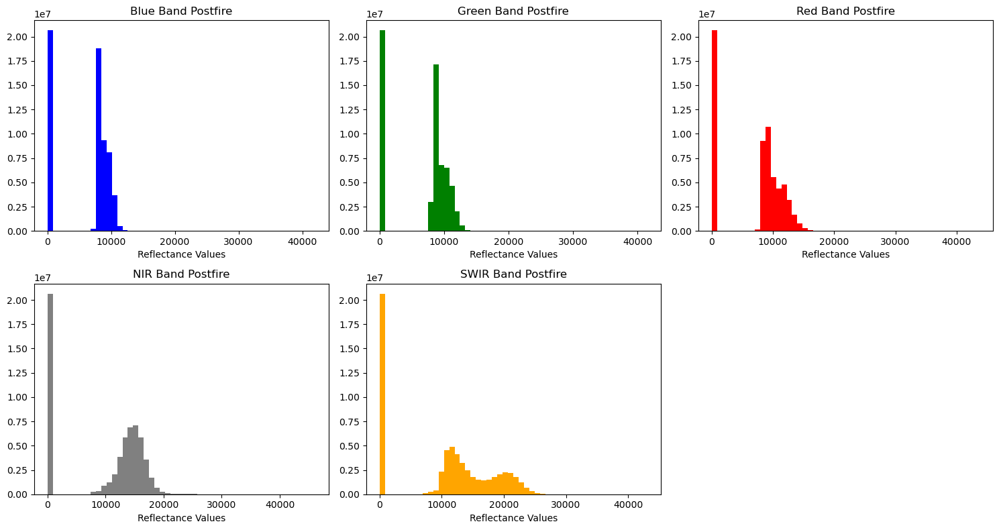

In [122]:

nbins = 50

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8), sharey=False)
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Plot Blue Band
axes[0].hist(NewSW_2020_blueband.ravel(), color='blue', bins=nbins)
axes[0].set_title('Blue Band Postfire')
axes[0].set_xlabel('Reflectance Values')

# Plot Green Band
axes[1].hist(NewSW_2020_greenband.ravel(), color='green', bins=nbins)
axes[1].set_title('Green Band Postfire')
axes[1].set_xlabel('Reflectance Values')

# Plot Red Band
axes[2].hist(NewSW_2020_redband.ravel(), color='red', bins=nbins)
axes[2].set_title('Red Band Postfire')
axes[2].set_xlabel('Reflectance Values')

# Plot NIR Band
axes[3].hist(NewSW_2020_nirband.ravel(), color='grey', bins=nbins)
axes[3].set_title('NIR Band Postfire')
axes[3].set_xlabel('Reflectance Values')

# Plot SWIR Band
axes[4].hist(NewSW_2020_swirband.ravel(), color='orange', bins=nbins)
axes[4].set_title('SWIR Band Postfire')
axes[4].set_xlabel('Reflectance Values')

# Hiding my unused sixth subplot (axes[5])
axes[5].axis('off')

plt.tight_layout()
plt.show()


#### Calculating and Plottng Difference in Reflectance Values.

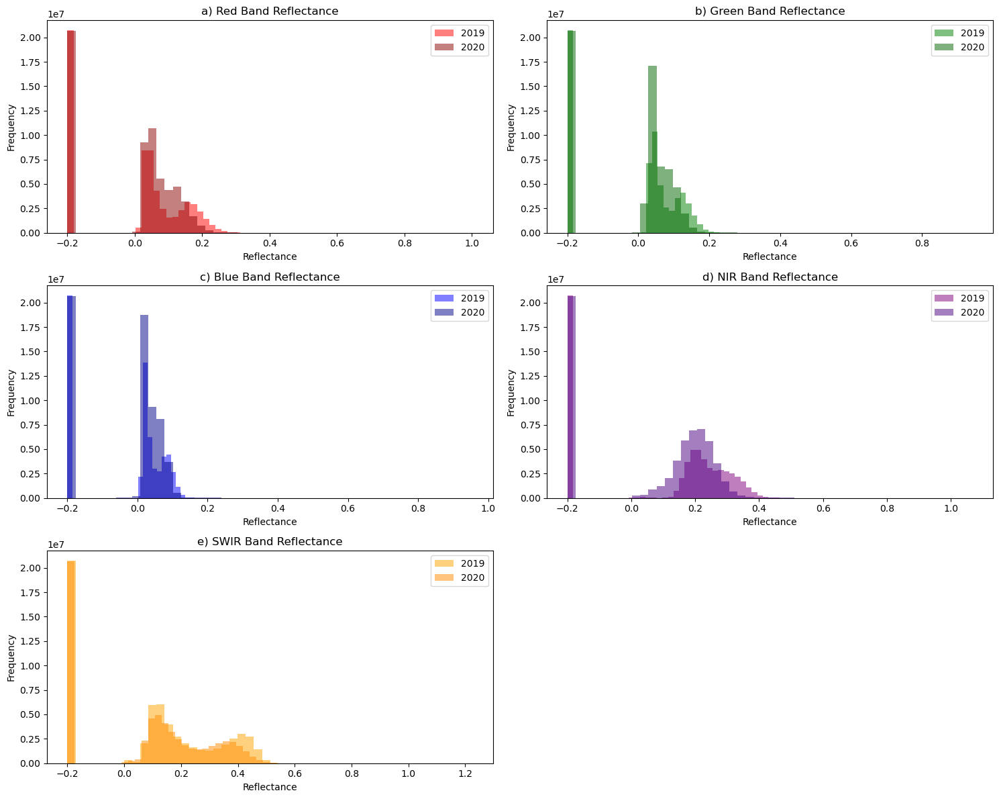

In [124]:

Red_2019 = NewSW2019_Red_reflect
Red_2020 = NewSW2020_Red_reflect
Green_2019 = NewSW2019_Green_reflect
Green_2020 = NewSW2020_Green_reflect
Blue_2019 = NewSW2019_Blue_reflect
Blue_2020 = NewSW2020_Blue_reflect
NIR_2019 = NewSW2019_NIR_reflect
NIR_2020 = NewSW2020_NIR_reflect
SWIR_2019 = NewSW2019_SWIR_reflect
SWIR_2020 = NewSW2020_SWIR_reflect


nbins = 50


fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 12), sharey=False)
axes = axes.flatten()  


def plot_hist(ax, data1, data2, color1, color2, title):
    ax.hist(data1.ravel(), bins=nbins, color=color1, alpha=0.5, label="2019")
    ax.hist(data2.ravel(), bins=nbins, color=color2, alpha=0.5, label="2020")
    ax.set_title(title)
    ax.set_xlabel('Reflectance')
    ax.set_ylabel('Frequency')
    ax.legend()  # Add legend to distinguish years

# Plot Red Band
plot_hist(axes[0], Red_2019, Red_2020, 'red', 'darkred', 'a) Red Band Reflectance')

# Plot Green Band
plot_hist(axes[1], Green_2019, Green_2020, 'green', 'darkgreen', 'b) Green Band Reflectance')

# Plot Blue Band
plot_hist(axes[2], Blue_2019, Blue_2020, 'blue', 'darkblue', 'c) Blue Band Reflectance')

# Plot NIR Band
plot_hist(axes[3], NIR_2019, NIR_2020, 'purple', 'indigo', 'd) NIR Band Reflectance')

# Plot SWIR Band
plot_hist(axes[4], SWIR_2019, SWIR_2020, 'orange', 'darkorange', 'e) SWIR Band Reflectance')

# Hide any unused subplot if necessary (e.g., 6th one)
axes[5].axis('off')


plt.tight_layout()


plt.show()


### Creating Color Composites.

#### Prefire New South Wales True Color (RGB) Creation

In [127]:
NewSW_2019_blue.shape

(7871, 7831)

In [128]:
nrows, ncols = NewSW_2019_blue.shape

In [129]:
NewSW_2019_RGB = np.empty((nrows, ncols, 3), dtype = 'uint8')

In [130]:
NewSW_2019_RGB[:, :, 0] = skimage.exposure.rescale_intensity(NewSW2019_Red_reflect, out_range = 'uint8')
NewSW_2019_RGB[:, :, 1] = skimage.exposure.rescale_intensity(NewSW2019_Green_reflect, out_range = 'uint8')
NewSW_2019_RGB[:, :, 2] = skimage.exposure.rescale_intensity(NewSW2019_Blue_reflect, out_range = 'uint8')
NewSW_2019_RGB

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

#### Postfire New South Wales True Color (RGB) Creation

In [132]:
NewSW_2020_blue.shape

(7871, 7821)

In [133]:
nrows, ncols = NewSW_2020_blue.shape

In [134]:
NewSW_2020_RGB =  np.empty((nrows, ncols, 3), dtype = 'uint8')

In [135]:
NewSW_2020_RGB[:, :, 0] = skimage.exposure.rescale_intensity(NewSW2020_Red_reflect, out_range = 'uint8')
NewSW_2020_RGB[:, :, 1] = skimage.exposure.rescale_intensity(NewSW2020_Green_reflect, out_range = 'uint8')
NewSW_2020_RGB[:, :, 2] = skimage.exposure.rescale_intensity(NewSW2020_Blue_reflect, out_range = 'uint8')
NewSW_2020_RGB

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

#### Plotting RGB Composites for both Prefire and Postfire (New South Wales).

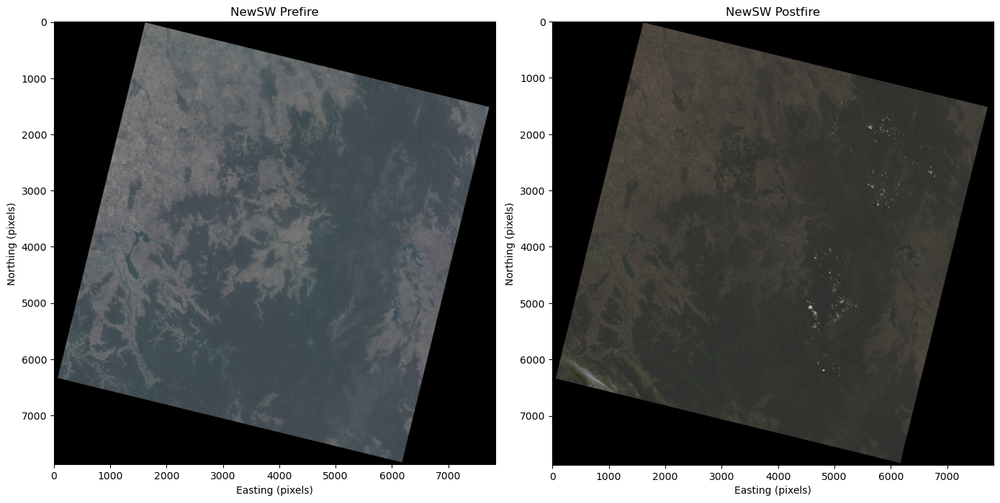

In [137]:
fig, axes = plt.subplots(1,2, figsize =(14,10))

#plot for prefire
axes[0].imshow(NewSW_2019_RGB)
axes[0].set_title('NewSW Prefire')
axes[0].set_ylabel('Northing (pixels)')
axes[0].set_xlabel('Easting (pixels)')

#plot for postfire
axes[1].imshow(NewSW_2020_RGB)
axes[1].set_title('NewSW Postfire')
axes[1].set_ylabel('Northing (pixels)')
axes[1].set_xlabel('Easting (pixels)')

plt.tight_layout()
plt.show()

#### Prefire New South Wales CIR Creation

In [139]:
NewSW_2019_CIR = np.empty((nrows, ncols, 3), dtype = 'uint8')

In [140]:
NewSW_2019_CIR.shape

(7871, 7821, 3)

In [141]:
print(f"{NewSW2019_NIR_reflect.shape}\n"
      f"{NewSW2019_Red_reflect.shape}\n"
      f"{NewSW2019_Green_reflect.shape}")


(7871, 7831)
(7871, 7831)
(7871, 7831)


From what was observed, the reflectance values of NIR, Red, and Green are not of the same shape dimensions as the CIR created. Hence, there is a need for reshaping.
 #### Resizing the Prefire Bands                                                                                                                                                   

In [143]:
from skimage.transform import resize

# Reshaping or cropping arrays to match the dimensions of NewSW_2019_CIR
target_shape = NewSW_2019_CIR.shape[:2]  # Target shape is (7871, 7821)

# Resizing inputs to match target shape
NewSW2019_NIR_reflect_resized = resize(NewSW2019_NIR_reflect, target_shape, mode='reflect', preserve_range=True)
NewSW2019_Red_reflect_resized = resize(NewSW2019_Red_reflect, target_shape, mode='reflect', preserve_range=True)
NewSW2019_Green_reflect_resized = resize(NewSW2019_Green_reflect, target_shape, mode='reflect', preserve_range=True)

# Assigning the resized data to NewSW_2019_CIR

from skimage import exposure

NewSW_2019_CIR[:, :, 0] = exposure.rescale_intensity(NewSW2019_NIR_reflect_resized, out_range='uint8')
NewSW_2019_CIR[:, :, 1] = exposure.rescale_intensity(NewSW2019_Red_reflect_resized, out_range='uint8')
NewSW_2019_CIR[:, :, 2] = exposure.rescale_intensity(NewSW2019_Green_reflect_resized, out_range='uint8')
NewSW_2019_CIR

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

#### Postfire New South Wales CIR Creation.

In [145]:
NewSW_2020_CIR =  np.empty((nrows, ncols, 3), dtype = 'uint8')

In [146]:
NewSW_2020_CIR.shape

(7871, 7821, 3)

In [147]:
print(f"{NewSW2020_NIR_reflect.shape}\n"
      f"{NewSW2020_Red_reflect.shape}\n"
      f"{NewSW2020_Green_reflect.shape}")

(7871, 7821)
(7871, 7821)
(7871, 7821)


There was no need for a resizing here since the shapes of the reflectance values fit the CIR created. 

In [149]:
NewSW_2020_CIR[:, :, 0] = skimage.exposure.rescale_intensity(NewSW2020_NIR_reflect, out_range = 'uint8')
NewSW_2020_CIR[:, :, 1] = skimage.exposure.rescale_intensity(NewSW2020_Red_reflect, out_range = 'uint8')
NewSW_2020_CIR[:, :, 2] = skimage.exposure.rescale_intensity(NewSW2020_Green_reflect, out_range = 'uint8')
NewSW_2020_CIR

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

#### Plotting CIR Composites for both Prefire and Postfire (New South Wales).

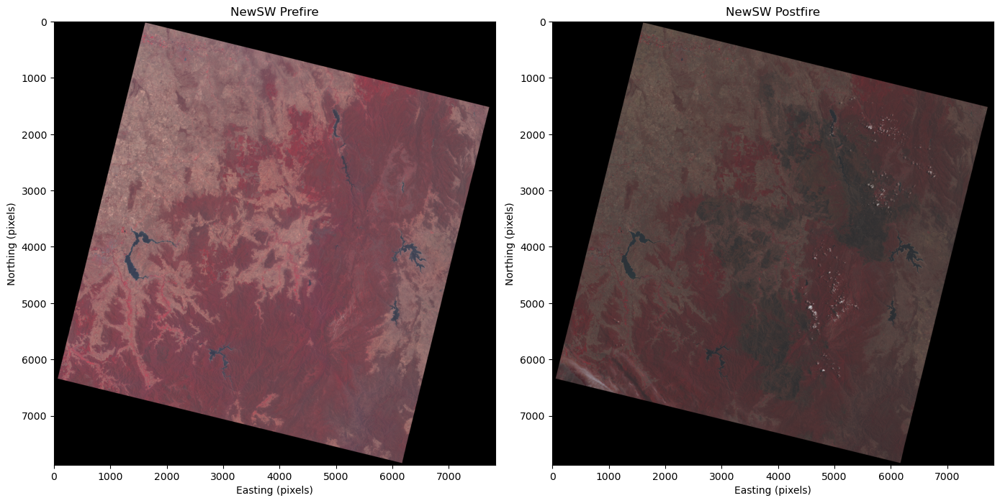

In [151]:
fig, axes = plt.subplots(1,2, figsize =(14,10))

#plot for prefire
axes[0].imshow(NewSW_2019_CIR)
axes[0].set_title('NewSW Prefire')
axes[0].set_ylabel('Northing (pixels)')
axes[0].set_xlabel('Easting (pixels)')

#plot for postfire
axes[1].imshow(NewSW_2020_CIR)
axes[1].set_title('NewSW Postfire')
axes[1].set_ylabel('Northing (pixels)')
axes[1].set_xlabel('Easting (pixels)')

plt.tight_layout()
plt.show()

### Indices Calculations

#### Normalized Difference Vegetation Index (NDVI).

In [154]:
#Let's recall our reflectance values:

#For Prefire:

NewSW2019_Blue_reflect = convert_to_reflectance(NewSW_2019_blueband)
NewSW2019_Green_reflect = convert_to_reflectance(NewSW_2019_greenband)
NewSW2019_Red_reflect = convert_to_reflectance(NewSW_2019_redband)
NewSW2019_NIR_reflect = convert_to_reflectance(NewSW_2019_nirband)
NewSW2019_SWIR_reflect = convert_to_reflectance(NewSW_2019_swirband)

#For Postfire:

NewSW2020_Blue_reflect = convert_to_reflectance(NewSW_2020_blueband)
NewSW2020_Green_reflect = convert_to_reflectance(NewSW_2020_greenband)
NewSW2020_Red_reflect = convert_to_reflectance(NewSW_2020_redband)
NewSW2020_NIR_reflect = convert_to_reflectance(NewSW_2020_nirband)
NewSW2020_SWIR_reflect = convert_to_reflectance(NewSW_2020_swirband)


Then, I created  a function to calculate for NDVI: 

In [156]:
def ndvi(red, nir):
    result = (nir - red)/(nir + red)
    return result

In [157]:
NewSW2019_NDVI = ndvi(NewSW2019_Red_reflect, NewSW2019_NIR_reflect)
NewSW2019_NDVI

array([[-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       ...,
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.]])

In [158]:
NewSW2020_NDVI = ndvi(NewSW2020_Red_reflect, NewSW2020_NIR_reflect)
NewSW2020_NDVI

array([[-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       ...,
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.]])

#### Mean of NDVIs.

In [160]:

mean_NDVI_2019 = np.mean(NewSW2019_NDVI)
mean_NDVI_2020 = np.mean(NewSW2020_NDVI)

print(f"Mean NDVI for 2019: {mean_NDVI_2019}")
print(f"Mean NDVI for 2020: {mean_NDVI_2020}")


Mean NDVI for 2019: 0.3253713912935595
Mean NDVI for 2020: 0.2957231823307351


#### Standard Deviation of NDVIs. 

In [278]:
std_dev_NDVI_2019 = np.std(NewSW2019_NDVI)
std_dev_NDVI_2020 = np.std(NewSW2020_NDVI)

print(f"Standard Deviation NDVI for 2019: {std_dev_NDVI_2019}")
print(f"Standard Deviation NDVI for 2020: {std_dev_NDVI_2020}")

Standard Deviation NDVI for 2019: 0.28906162722020584
Standard Deviation NDVI for 2020: 1.478145236418448


#### T-tests of NDVIs.

In [162]:
from scipy.stats import ttest_ind


# Flattening the NDVI arrays (in case they are 2D) and remove invalid values
ndvi_2019 = NewSW2019_NDVI.ravel()
ndvi_2020 = NewSW2020_NDVI.ravel()

# Masking invalid NDVI values (e.g., NDVI outside [-1, 1] or NaN values)
valid_ndvi_2019 = ndvi_2019[(ndvi_2019 >= -1) & (ndvi_2019 <= 1) & ~np.isnan(ndvi_2019)]
valid_ndvi_2020 = ndvi_2020[(ndvi_2020 >= -1) & (ndvi_2020 <= 1) & ~np.isnan(ndvi_2020)]

t_stat, p_value = ttest_ind(valid_ndvi_2019, valid_ndvi_2020, equal_var=False)


print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")


if p_value < 0.05:
    print("The difference in mean NDVI between 2019 and 2020 is statistically significant.")
else:
    print("The difference in mean NDVI between 2019 and 2020 is not statistically significant.")


T-statistic: 645.4588220702038
P-value: 0.0
The difference in mean NDVI between 2019 and 2020 is statistically significant.


#### Calculating Total Vegetation Area.

In [340]:

pixel_area_km2 = 30 * 30 / 1e6  # Pixel area in km^2 (900 m^2 per pixel)

# Applying threshold to identify vegetated pixels
vegetated_2019_mask = NewSW2019_NDVI > 0.2
vegetated_2020_mask = NewSW2020_NDVI > 0.2

# Count vegetated pixels
num_vegetated_pixels_2019 = np.count_nonzero(vegetated_2019_mask)
num_vegetated_pixels_2020 = np.count_nonzero(vegetated_2020_mask)

# Calculate total vegetated area
area_2019_km2 = num_vegetated_pixels_2019 * pixel_area_km2
area_2020_km2 = num_vegetated_pixels_2020 * pixel_area_km2

# Print results
print(f"Total vegetated area in 2019: {area_2019_km2:.2f} km²")
print(f"Total vegetated area in 2020: {area_2020_km2:.2f} km²")


Total vegetated area in 2019: 35468.09 km²
Total vegetated area in 2020: 35665.63 km²


#### Plotting NDVI for both Prefire and Postfire (New South Wales).

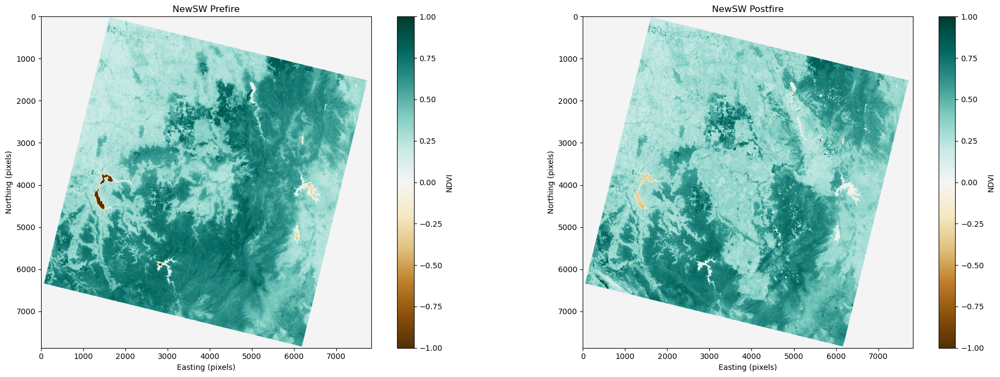

In [164]:

fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Plot for pre-fire NDVI
img1 = axes[0].imshow(NewSW2019_NDVI, cmap = "BrBG", vmin = -1, vmax = 1)
axes[0].set_title("NewSW Prefire")
axes[0].set_xlabel("Easting (pixels)")
axes[0].set_ylabel("Northing (pixels)")
fig.colorbar(img1, ax=axes[0], label="NDVI")

# Plot for post-fire NDVI
img2 = axes[1].imshow(NewSW2020_NDVI, cmap = "BrBG", vmin = -1, vmax = 1)
axes[1].set_title("NewSW Postfire")
axes[1].set_xlabel("Easting (pixels)")
axes[1].set_ylabel("Northing (pixels)")
fig.colorbar(img2, ax=axes[1], label="NDVI")

plt.tight_layout()
plt.show()

# NDVI 0.6 to 1.0: Dense Vegetation (e.g., forests, lush crops)
# NDVI 0.3 to 0.6: Moderate Vegetation (e.g., shrubs, grasslands, sparse crops)
# NDVI 0.1 to 0.3: Sparse Vegetation or Dry Soil
# NDVI 0.0 to 0.1: Barren Land or Built-up Areas (e.g., urban or bare soil)
# NDVI -1.0 to 0.0: Water or Clouds

#### Plotting NDVI for only Vegetated areas in Prefire and Postfire (New South Wales).

#### Normalized Burn Ratio (NBR). 

In [166]:
def nbr(nir, swir):
    result = (nir - swir) / (nir + swir)
    return result

In [167]:
NewSW2019_NBR = nbr(NewSW2019_NIR_reflect, NewSW2019_SWIR_reflect)
NewSW2019_NBR

array([[-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       ...,
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.]])

In [168]:
NewSW2020_NBR = nbr(NewSW2020_NIR_reflect, NewSW2020_SWIR_reflect)
NewSW2020_NBR

array([[-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       ...,
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [-0., -0., -0., ..., -0., -0., -0.]])

#### Mean of NBRs. 

In [170]:

mean_NBR_2019 = np.mean(NewSW2019_NBR)
mean_NBR_2020 = np.mean(NewSW2020_NBR)

print(f"Mean NBR for 2019: {mean_NBR_2019}")
print(f"Mean NBR for 2020: {mean_NBR_2020}")


Mean NBR for 2019: 0.05561396570334127
Mean NBR for 2020: 0.0008679495768718091


#### Standard Deviation of NBRs.

In [275]:
std_dev_NBR_2019 = np.std(NewSW2019_NBR)
std_dev_NBR_2020 = np.std(NewSW2020_NBR)

print(f"Standard Deviation NBR for 2019: {std_dev_NBR_2019}")
print(f"Standard Deviation NBR for 2020: {std_dev_NBR_2020}")

Standard Deviation NBR for 2019: 1.151503115353904
Standard Deviation NBR for 2020: 0.7390655761685458


#### T-tests of NBRs.

In [172]:

# Flattening the NBR arrays (in case they are 2D) and remove invalid values
nbr_2019 = NewSW2019_NBR.ravel()
nbr_2020 = NewSW2020_NBR.ravel()

# Masking invalid NBR values (e.g., NBR outside a typical range or NaN values)
valid_nbr_2019 = nbr_2019[~np.isnan(nbr_2019)]  # Remove NaNs
valid_nbr_2020 = nbr_2020[~np.isnan(nbr_2020)]  # Remove NaNs

# Performing an independent two-sample t-test
t_stat, p_value = ttest_ind(valid_nbr_2019, valid_nbr_2020, equal_var=False)


print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")


if p_value < 0.05:
    print("The difference in mean NBR between 2019 and 2020 is statistically significant.")
else:
    print("The difference in mean NBR between 2019 and 2020 is not statistically significant.")


T-statistic: 314.06649115615284
P-value: 0.0
The difference in mean NBR between 2019 and 2020 is statistically significant.


#### Calculating Total Burnt Area in 2020.

In [336]:

pixel_area_km2 = 30 * 30 / 1e6  # Pixel area in km^2 (900 m^2 per pixel)

# Define NBR threshold for burned areas
burn_threshold = 0.27

# Create a mask for burned areas
burned_mask_2020 = NewSW2020_NBR > burn_threshold

# Count the number of burned pixels
num_burned_pixels_2020 = np.count_nonzero(burned_mask_2020)

# Calculate total burned area in square kilometers
burned_area_2020_km2 = num_burned_pixels_2020 * pixel_area_km2

# Print results
print(f"Total burnt area in 2020: {burned_area_2020_km2:.2f} km²")


Total burnt area in 2020: 6412.67 km²


In [342]:
# Calculate the difference in NBR between pre-fire (2019) and post-fire (2020)
delta_nbr = NewSW2020_NBR - NewSW2019_NDVI_cropped

# Apply thresholds for burn severity
high_severity = delta_nbr > 0.66
moderate_high_severity = (delta_nbr >= 0.44) & (delta_nbr <= 0.66)
moderate_low_severity = (delta_nbr >= 0.27) & (delta_nbr < 0.44)

# Count pixels for high severity burns
num_high_severity_pixels = np.count_nonzero(high_severity)

# Calculate total area for high severity burns
high_severity_area_km2 = num_high_severity_pixels * pixel_area_km2

print(f"Total high severity burned area: {high_severity_area_km2:.2f} km²")


Total high severity burned area: 72.54 km²


#### Plotting NBR for both Prefire and Postfire (New South Wales).

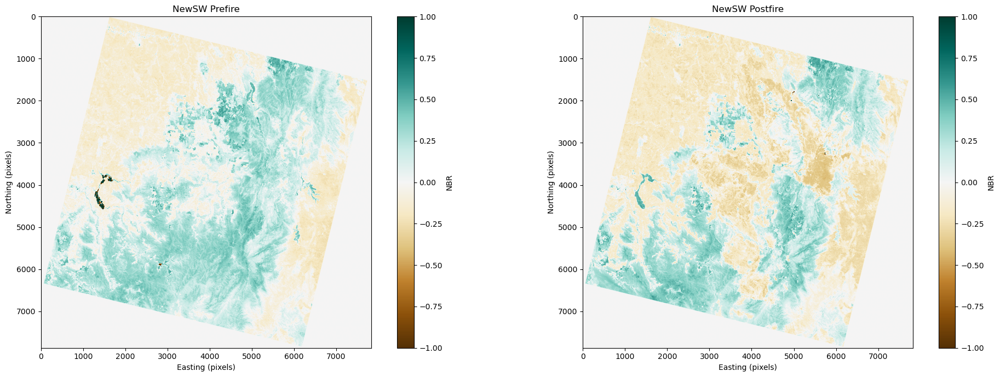

In [174]:

fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Plot for pre-fire NBR
img1 = axes[0].imshow(NewSW2019_NBR, cmap="BrBG", vmin=-1, vmax=1)
axes[0].set_title("NewSW Prefire")
axes[0].set_xlabel("Easting (pixels)")
axes[0].set_ylabel("Northing (pixels)")
fig.colorbar(img1, ax=axes[0], label="NBR")

# Plot for post-fire NBR
img2 = axes[1].imshow(NewSW2020_NBR, cmap="BrBG", vmin=-1, vmax=1)
axes[1].set_title("NewSW Postfire")
axes[1].set_xlabel("Easting (pixels)")
axes[1].set_ylabel("Northing (pixels)")
fig.colorbar(img2, ax=axes[1], label="NBR")

plt.tight_layout()
plt.show()
# NBR 0.7 to 1.0	High vegetation
# NBR 0.4 to 0.7	Moderate vegetation cover (shrubs, grasslands).
# NBR 0.1 to 0.4	Bare soil or sparse vegetation.
# NBR 0.0 to 0.1	Recently burned areas or urban areas.
# NBR -1.0 to 0.0	Water bodies or very reflective surfaces (e.g., snow, ice).

### Calculating Difference in NDVI

In [176]:
print(f"{NewSW2019_NDVI.shape}\n{NewSW2020_NDVI.shape}")

(7871, 7831)
(7871, 7821)


From what is observed in the cell above, the shapes of both the prefire NDVI and postfire NDVI are not the same. Hence, we need to resize the prefire NDVI.

In [178]:
NewSW2019_NDVI_cropped = NewSW2019_NDVI[:, :NewSW2020_NDVI.shape[1]]
NewSW_DNDVI = NewSW2020_NDVI - NewSW2019_NDVI_cropped

NewSW_DNDVI

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### Plotting Difference in NDVI

#### Plotting Differences in NDVIs as Histogram. 

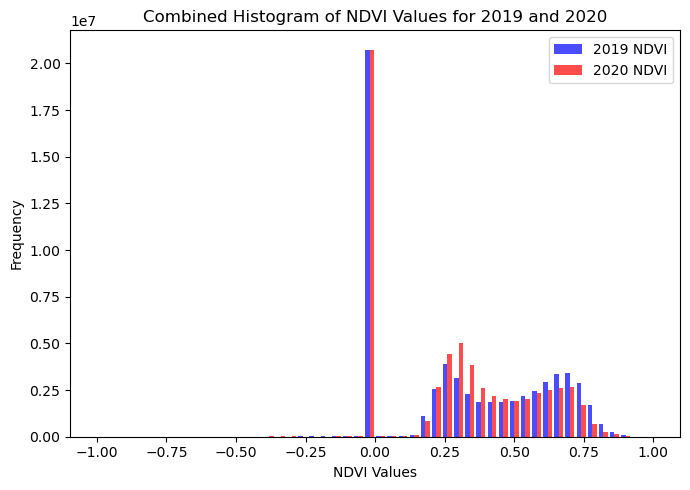

In [181]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming NewSW2019_NDVI and NewSW2020_NDVI are numpy arrays
# Flatten the NDVI arrays (in case they are 2D)
ndvi_2019 = NewSW2019_NDVI.ravel()
ndvi_2020 = NewSW2020_NDVI.ravel()

# Mask invalid NDVI values (e.g., NDVI outside [-1, 1] or NaN values)
valid_ndvi_2019 = ndvi_2019[(ndvi_2019 >= -1) & (ndvi_2019 <= 1) & ~np.isnan(ndvi_2019)]
valid_ndvi_2020 = ndvi_2020[(ndvi_2020 >= -1) & (ndvi_2020 <= 1) & ~np.isnan(ndvi_2020)]

# Number of bins for the histogram
nbins = 50

# Create a histogram
plt.figure(figsize=(7, 5))

# Plot NDVI for 2019 and 2020 in the same histogram with different colors
plt.hist([valid_ndvi_2019, valid_ndvi_2020], bins=nbins, color=['blue', 'red'], label=['2019 NDVI', '2020 NDVI'], alpha=0.7, stacked=False)

# Add labels, title, and legend
plt.xlabel('NDVI Values')
plt.ylabel('Frequency')
plt.title('Combined Histogram of NDVI Values for 2019 and 2020')
plt.legend(loc='upper right')  # Add legend to distinguish years

# Show the plot
plt.tight_layout()
plt.show()

#### Plotting Difference in NDVI as Imshow.

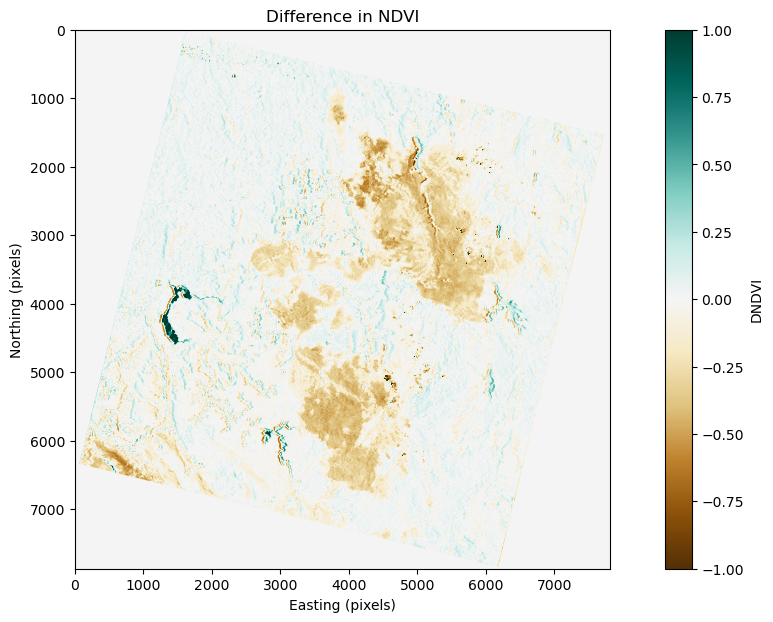

In [183]:
# Plot for DNDVI
fig, ax = plt.subplots(figsize=(14, 7))

img2 = ax.imshow(NewSW_DNDVI, cmap="BrBG", vmin=-1, vmax=1)

ax.set_title("Difference in NDVI")
ax.set_xlabel("Easting (pixels)")
ax.set_ylabel("Northing (pixels)")

fig.colorbar(img2, ax=ax, label="DNDVI")


#### Plotting Difference in NDVI for only Vegetated Areas.

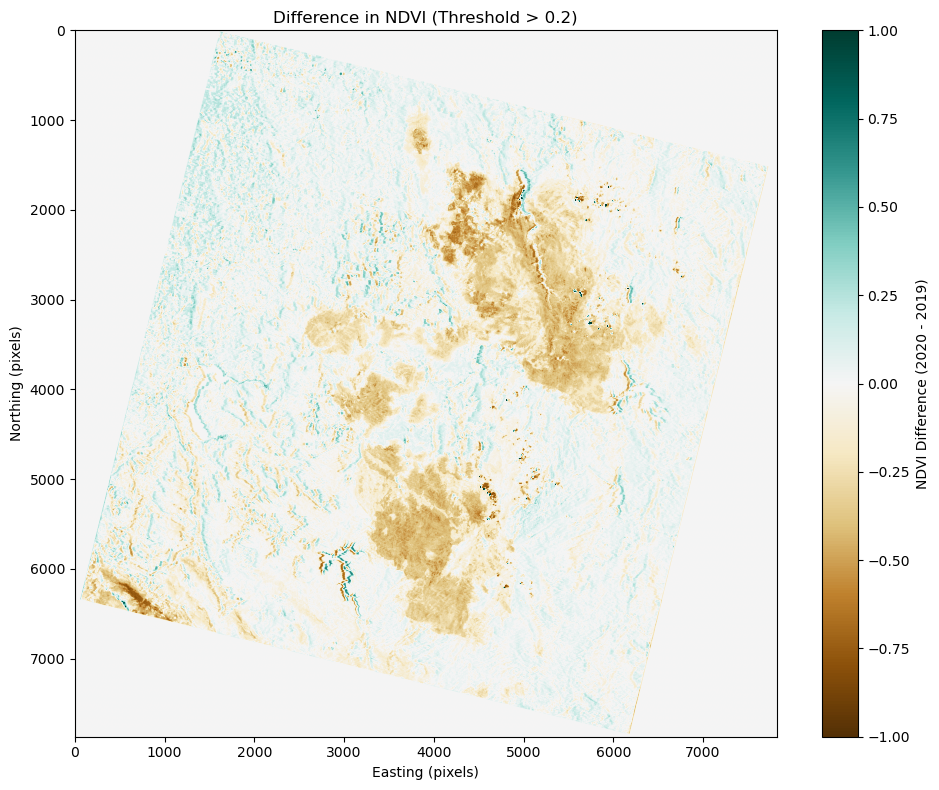

In [291]:

ndvi_2019_mask = NewSW2019_NDVI_cropped.copy()
ndvi_2020_mask = NewSW2020_NDVI.copy()

# Setting vegetation threshold
threshold = 0.2

# Masking out areas below the threshold for both years
ndvi_2019_mask[ndvi_2019_mask < threshold] = 0
ndvi_2020_mask[ndvi_2020_mask < threshold] = 0

# Calculating NDVI difference
ndvi_difference = ndvi_2020_mask - ndvi_2019_mask

# Plotting the NDVI difference
plt.figure(figsize=(10, 8))
plt.imshow(ndvi_difference, cmap='BrBG', vmin=-1, vmax=1)
plt.colorbar(label='NDVI Difference (2020 - 2019)')
plt.title('Difference in NDVI (Threshold > 0.2)')
plt.xlabel('Easting (pixels)')
plt.ylabel('Northing (pixels)')
plt.tight_layout()
plt.show()


#### Calculating Difference in NBR

In [185]:
print(f"{NewSW2019_NBR.shape}\n{NewSW2020_NBR.shape}")

(7871, 7831)
(7871, 7821)


From what is observed in the cell above, the shapes of both the prefire NDVI and postfire NDVI are not the same. Hence, we need to resize the prefire NDVI.

In [187]:
# Cropping NewSW2019_NBR to match the smaller array's shape
NewSW2019_NBR_cropped = NewSW2019_NBR[:, :NewSW2020_NBR.shape[1]]

NewSW_DNBR = NewSW2020_NBR - NewSW2019_NBR_cropped
NewSW_DNBR

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### Plotting Difference in NBR

#### Plotting Differences in NBRs as Histogram.

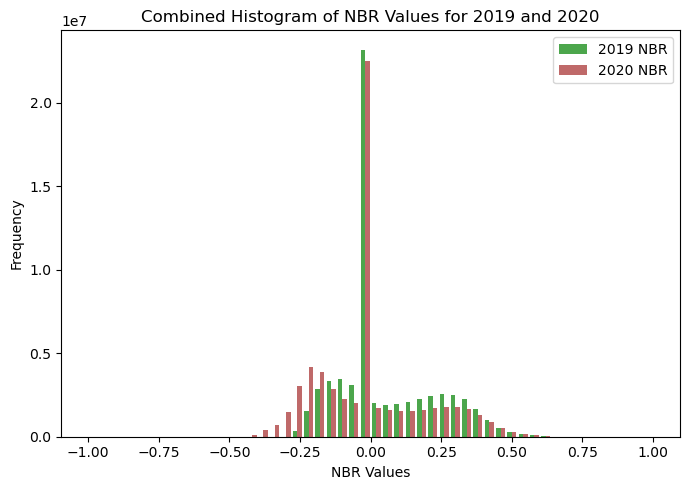

In [190]:

# Flattening the NBR arrays (in case they are 2D)
nbr_2019 = NewSW2019_NBR.ravel()
nbr_2020 = NewSW2020_NBR.ravel()

# Masking invalid NBR values (e.g., NaN values)
valid_nbr_2019 = nbr_2019[(nbr_2019 >= -1) & (nbr_2019 <= 1) & ~np.isnan(nbr_2019)]
valid_nbr_2020 = nbr_2020[(nbr_2020 >= -1) & (nbr_2020 <= 1) & ~np.isnan(nbr_2020)]

nbins = 50

plt.figure(figsize=(7, 5))
plt.hist([valid_nbr_2019, valid_nbr_2020], bins=nbins, color=['green', 'brown'], label=['2019 NBR', '2020 NBR'], alpha=0.7, stacked=False)
plt.xlabel('NBR Values')
plt.ylabel('Frequency')
plt.title('Combined Histogram of NBR Values for 2019 and 2020')
plt.legend(loc='upper right')  # Add legend to distinguish years

plt.tight_layout()
plt.show()


#### Plotting Differences in NBRs as Imshow.

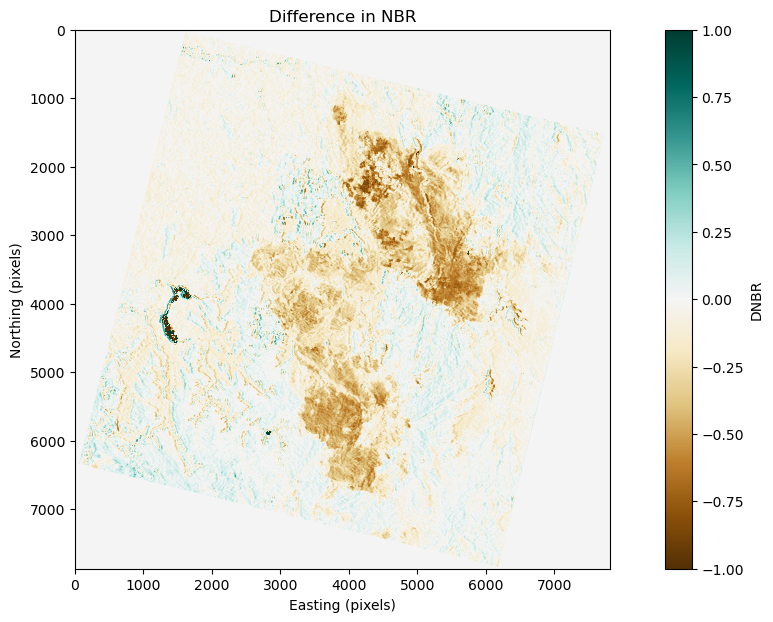

In [192]:

fig, ax = plt.subplots(figsize=(14, 7))

img2 = ax.imshow(NewSW_DNBR, cmap="BrBG", vmin=-1, vmax=1)

ax.set_title("Difference in NBR")
ax.set_xlabel("Easting (pixels)")
ax.set_ylabel("Northing (pixels)")

fig.colorbar(img2, ax=ax, label="DNBR")

#### Plotting Difference in NBR for only Burnt Areas.

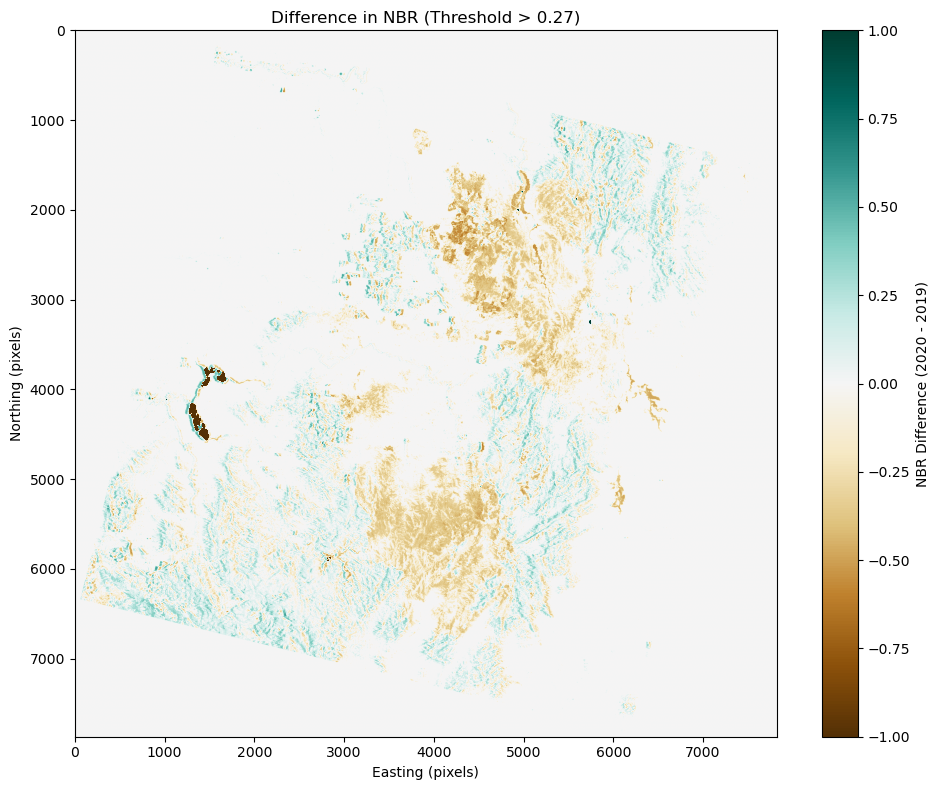

In [334]:

nbr_2019_mask = NewSW2019_NBR_cropped.copy()
nbr_2020_mask = NewSW2020_NBR.copy()

# Setting  threshold
threshold = 0.27

# Masking out areas below the threshold for both years
nbr_2019_mask[nbr_2019_mask < threshold] = 0
nbr_2020_mask[nbr_2020_mask < threshold] = 0

# Calculating NBR difference
nbr_difference = nbr_2020_mask - nbr_2019_mask

# Plotting the NBR difference
plt.figure(figsize=(10, 8))
plt.imshow(nbr_difference, cmap='BrBG', vmin=-1, vmax=1)
plt.colorbar(label='NBR Difference (2020 - 2019)')
plt.title('Difference in NBR (Threshold > 0.27)')
plt.xlabel('Easting (pixels)')
plt.ylabel('Northing (pixels)')
plt.tight_layout()
plt.show()
